In [30]:
import random
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import csv
import tensorflow as tf
from tensorflow.keras.models import Model
from neurite.tf import models  # Assuming the module's location
import voxelmorph.tf.losses as vtml
from tensorflow.keras.optimizers import Adam
from sklearn.model_selection import train_test_split
from keras.callbacks import ReduceLROnPlateau

from tensorflow.keras.layers import Input
from tensorflow.keras.layers import Lambda
import neurite as ne
import sys
import nibabel as nib
from tensorflow.keras.models import load_model
import numpy as np
import os
import tensorflow as tf
import tensorflow.keras.layers as KL
import voxelmorph as vxm

import nibabel as nib
from tensorflow.keras.models import load_model
from neurite_sandbox.tf.models import labels_to_labels
from neurite_sandbox.tf.models import labels_to_labels
from neurite_sandbox.tf.utils.augment import add_outside_shapes
from neurite.tf.utils.augment import draw_perlin_full
from utils import *

# en=[128,128,128,128,128]
# de=[128,128,128,128,128,2]

en=[16,32,64,64,64,64,64]
de=[64,64,64,64,64,32,16,2]

# en=[64,128,256,512]
# de=[512,256,128,64,2]

# en=[64,64,64,64,64]
# de=[64,64,64,64,64,2]
# if args.:
nb_features = '_'.join(map(str, en))
    
tf.get_logger().setLevel('ERROR')
log_dir='logs_feta'
models_dir='models_feta_mom_brain_params_'+str(nb_features)+"_nc_2_bs_2"
# models_dir='models_feta_mom_brain_params_128_128_128_128_128'
# checkpoint_path='weights_epoch_1000.h5'
initial_epoch=2000
# models_dir='models_feta_mom_brain_params_'+str(nb_features)+'_nc_'+str(args.nb_conv_per_level)+'_bs_'+str(args.batch_size)
nc=2
bs=2
checkpoint_path=models_dir+'/weights_epoch_'+str(initial_epoch)+'.h5'

data_dir = 'feta_2d/'
    
nb_labels=8
dimx=256
dimy=256



batch_size=4
warp_max=2   
warp_max=2.5
warp_min=.5
warp_blur_min=np.array([2, 4, 8])
warp_blur_max=warp_blur_min*2
bias_blur_min=np.array([2, 4, 8])
bias_blur_max=bias_blur_min*2
initial_lr=1e-4
lr = 1e-5
nb_levels=5
conv_size=3
num_epochs=50000
num_bg_labels=16
warp_fwhm_min=10
warp_fwhm_max=20
warp_min_shapes=10
warp_max_shapes=50
in_shape=(dimx,dimy)
bg_brain = True
labels_in=[i for i in range(num_bg_labels+nb_labels)]
labels_in_unique = np.unique(labels_in).astype(int)
image_fwhm_min=10
image_fwhm_max=20
aff_shift=64
aff_scale=0.2
aff_shear=0.1
bias_min=0.01
bias_max=0.2
zero_background=0.2

kwargs_shapes = {
'num_label': num_bg_labels,
'nb_labels':nb_labels,
'warp_min': warp_min_shapes,
'warp_max': warp_max_shapes,
'image_fwhm_max':image_fwhm_max,
'image_fwhm_min':image_fwhm_min,
'zero_background':zero_background
}

gen_arg = {
    'in_shape': in_shape,
    'labels_in': labels_in,
    'labels_out': {i: 1 if i > 0 and i < nb_labels else 0 for i in range(num_bg_labels+nb_labels)},  
    'warp_min': warp_min,
    'one_hot':True,
    'axes_flip':True,
    'axes_swap':True,
    'warp_max': warp_max,
    'aff_shift':aff_shift,
    'aff_rotate':180,
    'aff_scale':aff_scale,
    'aff_shear':aff_shear,
    'bias_min':bias_min,
    'bias_max':bias_max,
    'bias_func':tf.exp,
    'zero_background':zero_background
}

print(labels_in,num_bg_labels+nb_labels)
# labels_to_image_model = ne.models.labels_to_image_new(**gen_arg)
unet_model = vxm.networks.Unet(inshape=(dimx, dimy, 1), nb_features=[en, de], 
                               nb_conv_per_level=2,
                               final_activation_function=tf.nn.softmax)

input_img = Input(shape=(dimx, dimy,1))
# labels_to_image_model = ne.models.labels_to_image_new(**gen_arg)#,input_model=labels_to_labels_model)


unet_model = vxm.networks.Unet(inshape=(dimx, dimy, 1), nb_features=[en, de], 
                               nb_conv_per_level=2,
                               final_activation_function=tf.nn.softmax)

labels_to_image_model = ne.models.labels_to_image_new(**gen_arg)

input_img = Input(shape=(dimx, dimy))
generated_img, y = labels_to_image_model(input_img)
print(generated_img.shape,y.shape)

segmentation = unet_model(generated_img)
combined_model = Model(inputs=input_img, outputs=segmentation)
combined_model.add_loss(dice_loss(y, segmentation))
combined_model.compile(optimizer=Adam(learning_rate=initial_lr))


if os.path.exists(checkpoint_path):
    combined_model.load_weights(checkpoint_path)
    print("Loaded weights from the checkpoint and continued training.")
else:
    print(checkpoint_path)
    print("Checkpoint file not found.")


def load_data(data_dir):
    
    subject_dirs = [d for d in os.listdir(data_dir) if d.startswith('sub-')]
    seg_image_filenames = []
    real_image_filenames = []
    fetal_data = []  # List to store fetal images
    fetal_segmentation_masks = []  # List to store fetal segmentation masks
    
    for subject_dir in subject_dirs:
        subject_prefix = subject_dir
    
        # Search for the T2-weighted image and segmented brain image with flexible naming patterns
        t2w_path = None
        dseg_path = None
        # print(os.path.join(data_dir, subject_prefix))
        for filename in os.listdir(os.path.join(data_dir, subject_prefix)):
            if "_T2w.nii.gz" in filename:
                t2w_path = os.path.join(data_dir, subject_prefix, filename)
            elif "_dseg.nii.gz" in filename:
                dseg_path = os.path.join(data_dir, subject_prefix, filename)
    
        if t2w_path is None or dseg_path is None:
            print(f"Data not found for subject {subject_prefix}. Skipping...")
            continue
    
        # Append the filenames to the respective lists
        real_image_filenames.append(t2w_path)
        seg_image_filenames.append(dseg_path)
        
    for i in range(len(real_image_filenames)):
        # Load the 2D image
        img_path = real_image_filenames[i]
        real_img = nib.load(img_path).get_fdata()

        seg_img_path = seg_image_filenames[i]
        seg_img = nib.load(seg_img_path).get_fdata()

        min_value = np.min(real_img)
        max_value = np.max(real_img)
        real_img = (real_img - min_value) / (max_value - min_value)

        real_img = tf.expand_dims(real_img, axis=0)  # Shape becomes (1, 160, 192, 1)
        fetal_data.append(real_img)
        fetal_segmentation_masks.append(seg_img)
    return fetal_data, fetal_segmentation_masks

        
fetal_data, fetal_segmentation_masks = load_data(data_dir)
X_train, X_test, y_train, y_test = train_test_split(fetal_data, fetal_segmentation_masks, test_size=0.2, random_state=42)

# unet_model = load_model(checkpoint_path)

train_dice_coefficients = []
test_dice_coefficients = []


for i in range(len(X_train)):
    real_img = X_train[i]
    seg_img = y_train[i]

    # Ensure that the input has the correct shape (None, 256, 256, 1)
    real_img = tf.expand_dims(real_img, axis=-1)  # Shape becomes (1, dimx, dimy, 1)

    y_pred = unet_model.predict(real_img, verbose=0)
    # print(y_pred.shape)
    y_pred = tf.argmax(y_pred, axis=-1, output_type=tf.int32)

    train_dice = dice_coefficient(seg_img, y_pred)
    train_dice_coefficients.append(train_dice)





[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23] 24
(None, 256, 256, 1)
(None, 256, 256, 1)
(None, 256, 256, 1) (None, 256, 256, 2)
dice (None, 256, 256, 2) (None, 256, 256, 2)
Loaded weights from the checkpoint and continued training.


Average Dice coefficient for the training set: 0.662345249655621
Average Dice coefficient for the testing set: 0.6896091416083084


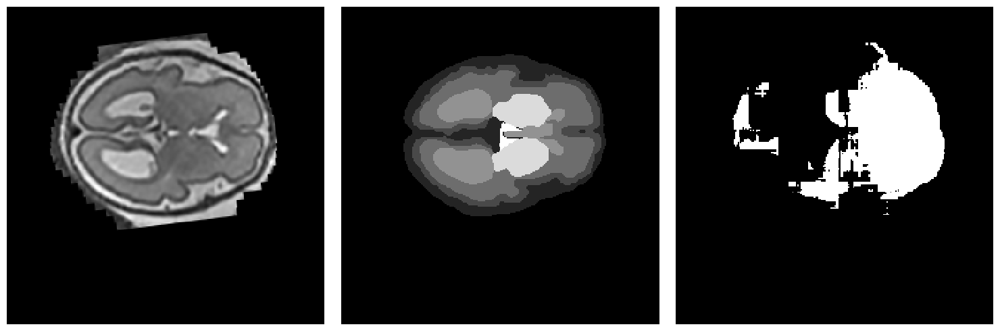

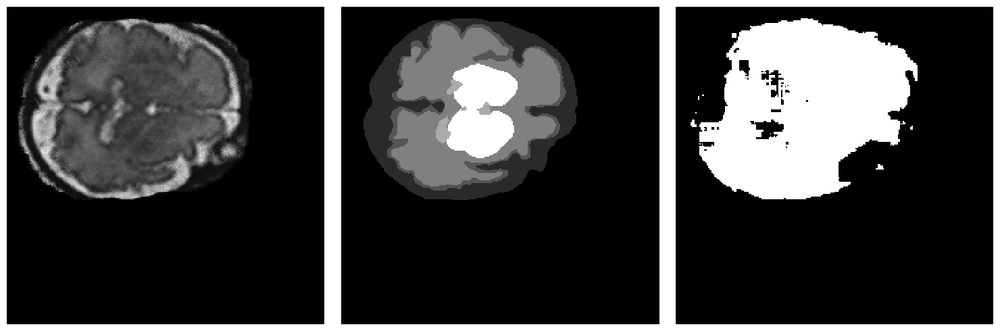

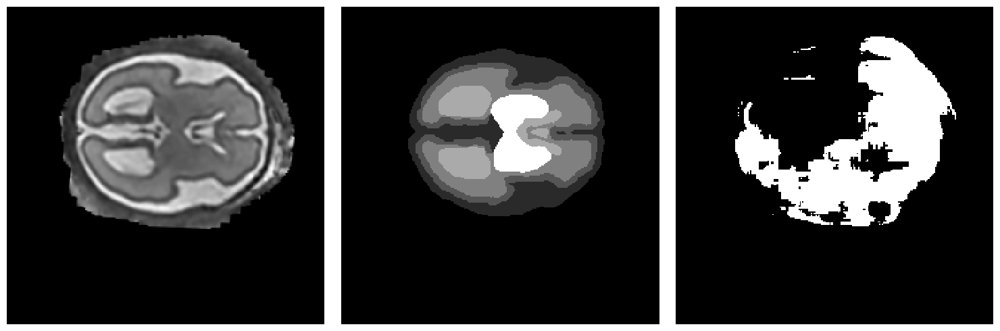

In [22]:
y_preds=[]
# Calculate Dice coefficient for the testing set
for i in range(len(X_test)):
    real_img = X_test[i]
    seg_img = y_test[i]

    real_img = tf.expand_dims(real_img, axis=-1)  # Shape becomes (1, dimx, dimy, 1)
    y_pred = unet_model.predict(real_img, verbose=0)

    y_pred = tf.argmax(y_pred, axis=-1, output_type=tf.int32)
    y_preds.append(y_pred)
    test_dice = dice_coefficient(seg_img, y_pred)
    test_dice_coefficients.append(test_dice)

# Calculate the average Dice coefficients for training and testing sets
average_train_dice = np.mean(train_dice_coefficients)
average_test_dice = np.mean(test_dice_coefficients)

print(f"Average Dice coefficient for the training set: {average_train_dice}")
print(f"Average Dice coefficient for the testing set: {average_test_dice}")

for i in range(3):
    ne.plot.slices(slices_in=(X_test[i], y_test[i], y_preds[i]), cmaps=['gray', 'gray', 'gray'])

256 256
1/1 [==============================] - 1s 616ms/step
(1, 256, 256, 1) [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15] 8 16
[ 8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23]
1/1 [==============================] - 1s 571ms/step
(1, 256, 256, 1) [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15] 8 16
[ 8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23]
1/1 [==============================] - 1s 567ms/step
(1, 256, 256, 1) [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15] 8 16
[ 8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23]
1/1 [==============================] - 1s 552ms/step
(1, 256, 256, 1) [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15] 8 16
[ 8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23]
1/1 [==============================] - 1s 559ms/step
(1, 256, 256, 1) [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15] 8 16
[ 8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23]
1/1 [==============================] - 1s 537ms/step
(1, 256, 256, 1) [ 0  2  3  4  5  6  7  8  9 10 11 12 13 14 15] 

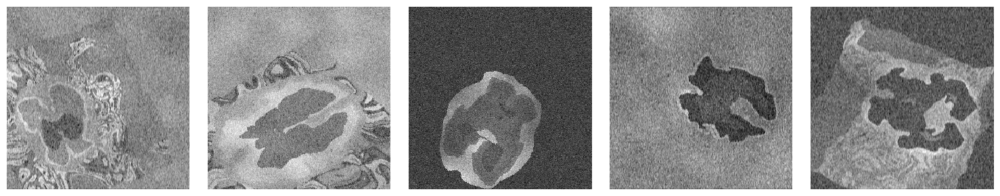

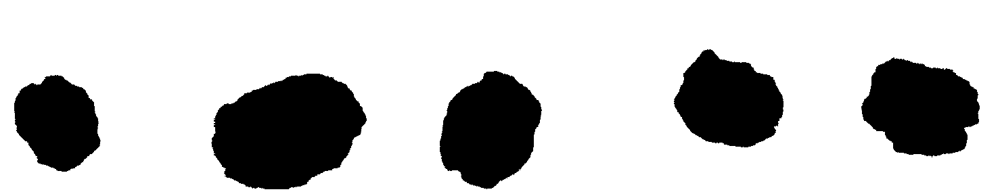

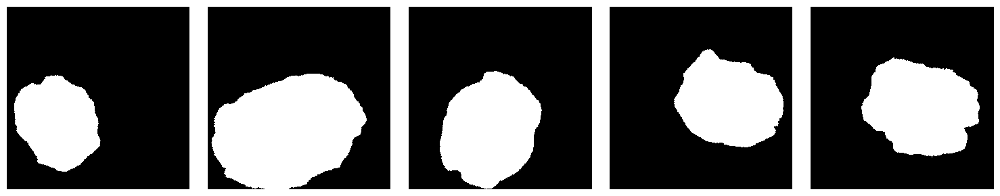

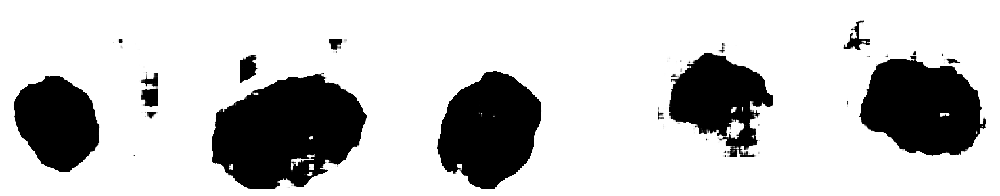

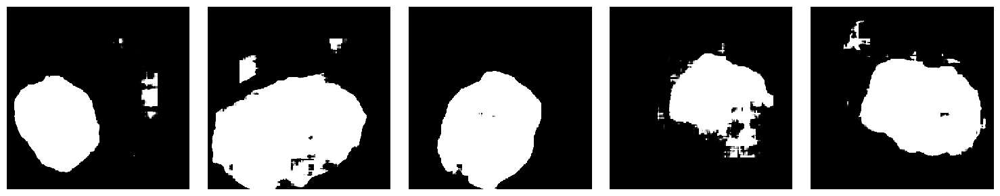

...

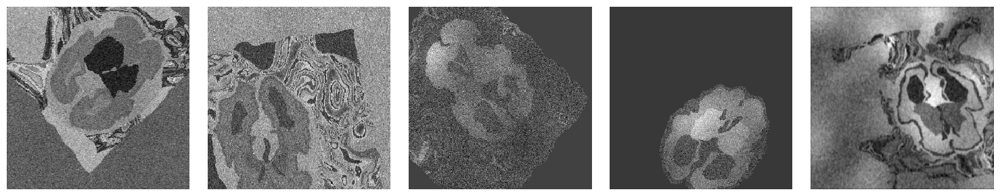

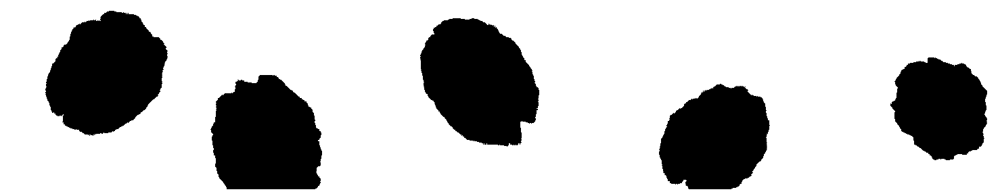

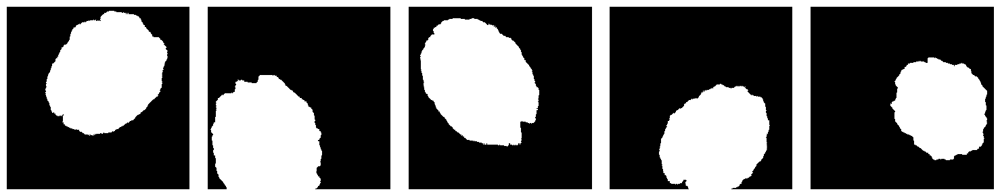

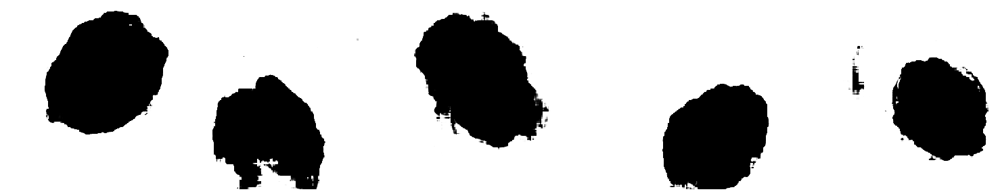

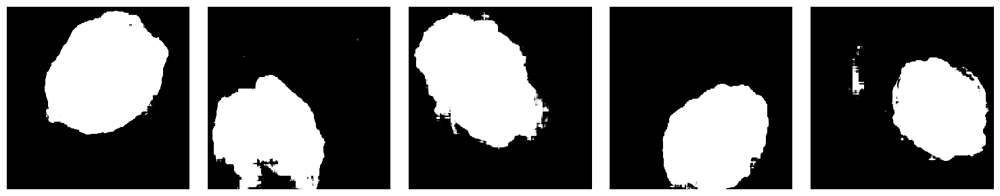

Model: "unet"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 unet_input (InputLayer)     [(None, 256, 256, 1)]        0         []                            
                                                                                                  
 unet_enc_conv_0_0 (Conv2D)  (None, 256, 256, 16)         160       ['unet_input[0][0]']          
                                                                                                  
 unet_enc_conv_0_0_activati  (None, 256, 256, 16)         0         ['unet_enc_conv_0_0[0][0]']   
 on (LeakyReLU)                                                                                   
                                                                                                  
 unet_enc_conv_0_1 (Conv2D)  (None, 256, 256, 32)         4640      ['unet_enc_conv_0_0_activat

In [39]:
num_shapes = 100
num_rows = 20
num_cols = 5
# labels_in=[i for i in range(num_bg_labels+nb_labels+1)]

# gen_arg = {
#     'in_shape': in_shape,
#     'labels_in': labels_in,
#     'labels_out': {i: 1 if i > 0 and i < nb_labels else 0 for i in range(num_bg_labels+nb_labels)},  
#     'warp_min': warp_min,
#     'one_hot':True,
#     'axes_flip':True,
#     'axes_swap':True,
#     'warp_max': warp_max,
#     'aff_shift':aff_shift,
#     'aff_rotate':180,
#     'aff_scale':aff_scale,
#     'aff_shear':aff_shear,
#     'bias_min':bias_min,
#     'bias_max':bias_max,
#     'bias_func':tf.exp,
#     'zero_background':zero_background
# }

# labels_to_image_model = ne.models.labels_to_image_new(**gen_arg)

combined_images=[]
combined_label_maps=[]
data_generator = my_generator(y_train, batch_size=1, same_subj=False, flip=False,**kwargs_shapes)
num_iterations = num_shapes  # Set the number of iterations as needed

for i in range(num_iterations):
    gg, y = next(data_generator)
    combined_label_maps.append(gg)




combined_images = []
combined_images0 = []
combined_images1 = []

combined_maps=[]
y_preds0=[]
y_preds1=[]

y_preds=[]
test_dice_coefficients = []
def dice_coefficient(y_true, y_pred):
    if isinstance(y_true, np.ndarray) and isinstance(y_pred, np.ndarray):
        y_true = tf.convert_to_tensor(y_true)
        y_pred = tf.convert_to_tensor(y_pred)
    ndims = len(y_pred.get_shape().as_list()) - 2
    vol_axes = list(range(1, ndims + 1))

    top = 2 * tf.reduce_sum(y_true * y_pred, vol_axes)
    bottom = tf.reduce_sum(y_true + y_pred, vol_axes)

    div_no_nan = tf.math.divide_no_nan if hasattr(
    tf.math, 'divide_no_nan') else tf.div_no_nan  # pylint: disable=no-member
    dice = tf.reduce_mean(div_no_nan(top, bottom))
    return dice
    
for lm in combined_label_maps:
    lm = np.expand_dims(lm, axis=-1)
    a = np.unique(lm).astype(int)
    # print(a)
    im, label_map = labels_to_image_model.predict(lm)    
    # print(label_map.shape)
    y_pred = unet_model.predict(im, verbose=0)

    y_preds0.append(y_pred[:,:,:,0])
    y_preds1.append(y_pred[:,:,:,1])

    y_preds.append(np.argmax(y_pred, axis=-1))
    combined_images0.append(label_map[:,:,:,0])   
    combined_images1.append(label_map[:,:,:,1])   

    
    # y_pred=np.argmax(y_pred, axis=-1)
    print(label_map.shape,y_pred.shape)
    test_dice = dice_coefficient(label_map, y_pred)
    test_dice_coefficients.append(test_dice)

    combined_images.append(np.squeeze(im, -1))   

average_test_dice = np.mean(test_dice_coefficients)
print(f"Average Dice coefficient for the test set: {average_test_dice}")
 
image_rows = [combined_images[i:i+num_cols] for i in range(0, len(combined_images), num_cols)]
image_rows0 = [combined_images0[i:i+num_cols] for i in range(0, len(combined_images), num_cols)]
image_rows1 = [combined_images1[i:i+num_cols] for i in range(0, len(combined_images), num_cols)]

preds_rows = [y_preds[i:i+num_cols] for i in range(0, len(y_preds), num_cols)]
preds_rows0 = [y_preds0[i:i+num_cols] for i in range(0, len(y_preds), num_cols)]
preds_rows1 = [y_preds1[i:i+num_cols] for i in range(0, len(y_preds), num_cols)]


for i in range(len(image_rows)):
    # map_row = maps_rows[i]
    im_row = image_rows[i]
    im_row0 = image_rows0[i]
    im_row1 = image_rows1[i]

    pred_row = preds_rows[i]
    pred_row0 = preds_rows0[i]
    pred_row1 = preds_rows1[i]
    
    ne.plot.slices([list(shape) for shape in im_row], cmaps=['gray'] * num_cols)
    ne.plot.slices([list(shape) for shape in im_row0], cmaps=['gray'] * num_cols)
    ne.plot.slices([list(shape) for shape in im_row1], cmaps=['gray'] * num_cols)

    # ne.plot.slices([list(pred) for pred in pred_row], cmaps=['gray'] * num_cols)
    ne.plot.slices([list(pred) for pred in pred_row0], cmaps=['gray'] * num_cols)
    ne.plot.slices([list(pred) for pred in pred_row1], cmaps=['gray'] * num_cols)

unet_model.summary()

In [ ]:
print(preds_rows[0][0].shape)